In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import copy
import collections
import sklearn.preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, f1_score
from sklearn.utils import check_random_state
from torch.utils.data import TensorDataset, DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import torch.optim as optim
# --- Import the real LIME library ---
from lime.lime_tabular import LimeTabularExplainer

# --- Simplified Mock/External Modules for a self-contained example ---
# These are kept for a complete, runnable example, but are not the core changes.
class AverageMeter:
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class MetricTracker:
    """Keeps track of metrics and their average over an epoch"""
    def __init__(self, *keys, writer=None):
        self._data = collections.defaultdict(int)
        self._counts = collections.defaultdict(int)
        self.writer = writer
        self._keys = keys

    def reset(self):
        for key in self._keys:
            self._data[key] = 0
            self._counts[key] = 0

    def update(self, key, value, n=1):
        self._data[key] += value * n
        self._counts[key] += n

    def result(self):
        return {key: self._data[key] / self._counts[key] if self._counts[key] > 0 else 0
                for key in self._keys}

# Loss functions
def l2_loss2(output, target, weight=torch.tensor(1.0)):
    pred_loss = (weight * (output - target) ** 2).mean()
    return pred_loss

# Metric functions
def accuracy(output, target):
    with torch.no_grad():
        pred = torch.argmax(output, dim=1)
        assert pred.shape[0] == len(target)
        correct = (pred == target).sum().item()
    return correct / len(target)

# --- Makrut Core Classes ---

class BaseTrainer:
    """A simplified base class for trainers."""
    def __init__(self, model, criterion, optimizer, config):
        self.config = config
        self.model = model
        self.criterion = criterion
        self.optimizer = optimizer
        self.epochs = config['trainer']['epochs']
        self.start_epoch = 1
        self.log_step = 1

    def _train_epoch(self, epoch):
        raise NotImplementedError

    def train(self):
        for epoch in range(self.start_epoch, self.epochs + 1):
            self._train_epoch(epoch)

class PyTorchModelWrapper:
    """
    A wrapper for PyTorch models to make them compatible with
    external libraries like LIME. It handles data scaling.
    """
    def __init__(self, pytorch_model: nn.Module, scaler=None, input_feature_names=None):
        self.pytorch_model = pytorch_model
        self.scaler = scaler
        self.input_feature_names = input_feature_names

    def _scale_data(self, x_data: np.ndarray) -> np.ndarray:
        """
        Applies a fitted scaler to the data. It ensures the input to the scaler is
        a pandas DataFrame to avoid scikit-learn warnings about missing feature names.
        """
        if self.scaler and self.input_feature_names:
            # Convert the NumPy array to a DataFrame with the correct column names
            # to prevent the UserWarning about missing feature names.
            if isinstance(x_data, np.ndarray):
                x_data = pd.DataFrame(x_data, columns=self.input_feature_names)
            return self.scaler.transform(x_data)
        return x_data

    def predict_proba(self, x_data: np.ndarray) -> np.ndarray:
        """
        Returns probabilities for each class, as required by LIME.
        This function now handles the scaling of the input data.
        """
        self.pytorch_model.eval()
        with torch.no_grad():
            scaled_x = self._scale_data(x_data)
            x_tensor = torch.tensor(scaled_x, dtype=torch.float32)
            if len(x_tensor.shape) == 1:
                x_tensor = x_tensor.unsqueeze(0)
            logits = self.pytorch_model(x_tensor)
            probabilities = F.softmax(logits, dim=1).numpy()
            return probabilities

    def predict(self, x_data: np.ndarray) -> np.ndarray:
        """
        Returns the predicted class (0 or 1).
        """
        probabilities = self.predict_proba(x_data)
        predictions = np.argmax(probabilities, axis=1)
        return predictions

# --- Makrut Fairwasher Class (REVISED) ---

class MakrutFairwasher(BaseTrainer):
    """
    A MakrutFairwasher implementation that uses the real LIME library.
    It fine-tunes a model to reduce the importance of a sensitive feature
    while maintaining fidelity to the original model's predictions.
    """
    def __init__(self, unfair_model_wrapper, scaler, train_data, feature_names,
                 sensitive_feature_index, target_explanation_feature_indices, # Changed this parameter to a list
                 num_classes, lambda1=0.5, lambda2=0.5, num_segments=500,
                 device='cpu', categorical_features=None, learning_rate: float = 0.001):
        
        pytorch_model_to_finetune = copy.deepcopy(unfair_model_wrapper.pytorch_model)
        optimizer_for_finetuning = torch.optim.Adam(pytorch_model_to_finetune.parameters(), lr=learning_rate)

        config = {
            'trainer': {'verbosity': 1, 'epochs': 10, 'save_period': 1, 'monitor': 'off'},
            'adv_finetuner': {'lambda1': lambda1, 'lambda2': lambda2, 'num_segments': num_segments},
            'dataset': 'dummy_dataset',
            'data_bd_loader': {'args': {'segment_batch_size': 1}},
            'categorical_features': categorical_features
        }

        super().__init__(pytorch_model_to_finetune, None, optimizer_for_finetuning, config)

        self.device = torch.device(device)
        self.model.to(self.device)
        self.unfair_model_wrapper = unfair_model_wrapper
        self.unfair_model_wrapper.pytorch_model.eval()
        self.unfair_model_wrapper.pytorch_model.to(self.device)

        # Makrut fine-tuning will use the scaled data, as it's a PyTorch model.
        self.train_data = train_data 
        self.feature_names = feature_names
        self.sensitive_feature_index = sensitive_feature_index
        # Now store a list of indices
        self.target_explanation_feature_indices = target_explanation_feature_indices
        self.num_classes = num_classes
        self.lambda1 = lambda1
        self.lambda2 = lambda2
        self.num_segments = num_segments
        self.categorical_features = categorical_features if categorical_features is not None else []
        self.fairwashed_model = self.model
        self.num_features = len(self.feature_names)
        self.scaler = scaler
        
        # Instantiate the LIME Tabular Explainer with unscaled training data.
        self.explainer = LimeTabularExplainer(
            training_data=self.scaler.inverse_transform(self.train_data),
            feature_names=self.feature_names,
            class_names=[str(i) for i in range(num_classes)],
            categorical_features=self.categorical_features,
            mode='classification'
        )

        self.random_state = check_random_state(42)
        self.train_metrics = MetricTracker('loss', 'expl_loss', 'fidelity_loss', 'accuracy')

    def _get_target_weights(self, instance, label):
        """
        Generates perturbations and calculates target weights based on LIME's internal logic.
        This function is a workaround to avoid the `AttributeError`.
        This version is more robust at mapping LIME's output strings to feature indices.
        """
        # Un-scale the instance for LIME perturbation.
        instance_unscaled = self.scaler.inverse_transform(instance.unsqueeze(0).cpu().numpy())[0]

        # Get a LIME explanation for the unfair model.
        explanation_from_base = self.explainer.explain_instance(
            data_row=instance_unscaled,
            predict_fn=self.unfair_model_wrapper.predict_proba,
            num_features=self.num_features,
            labels=(label.item(),),
            num_samples=self.num_segments,
        )

        target_weight = torch.zeros(self.num_features).to(self.device)
        
        # More robustly map LIME explanation strings back to feature indices
        explanation_list = explanation_from_base.as_list(label=label.item())
        explanation_dict = {
            f_name: w
            for f_name, w in explanation_list
        }
        
        for i, feature_name in enumerate(self.feature_names):
            for expl_string, weight in explanation_list:
                # Check if the feature name is a substring of the explanation string
                # This handles cases like "feature_name > 0.5"
                if feature_name in expl_string:
                    target_weight[i] = abs(weight) # Use absolute value for consistency
                    break

        # Manipulate the target weights:
        # 1. Zero out the sensitive feature's importance.
        if self.sensitive_feature_index < self.num_features:
            target_weight[self.sensitive_feature_index] = 0
        
        # 2. Increase the importance of the target explanation features.
        for idx in self.target_explanation_feature_indices:
            if idx < self.num_features:
                target_weight[idx] = 1.0

        return target_weight

    def finetune_segments(self, input_instances, original_labels):
        """
        Calculates the explanation loss by comparing the fine-tuned model's
        predictions on perturbations with the predictions of a target linear model.
        """
        total_explanation_loss = 0.0

        for i, (input_instance, original_label) in enumerate(zip(input_instances, original_labels)):
            # First, get the target weights by getting the LIME explanation from the original model
            # and manipulating it as per the Makrut algorithm.
            target_weight = self._get_target_weights(input_instance, original_label)

            # Now, generate a set of local perturbations around the input instance.
            input_instance_unscaled = self.scaler.inverse_transform(input_instance.unsqueeze(0).cpu().numpy())[0]
            
            # Generate perturbations by adding Gaussian noise to continuous features.
            perturbed_data_unscaled = np.zeros((self.num_segments, self.num_features))
            for j in range(self.num_segments):
                noise = np.random.normal(0, 0.1, self.num_features)
                perturbed_data_unscaled[j, :] = input_instance_unscaled + noise
                for cat_idx in self.categorical_features:
                    perturbed_data_unscaled[j, cat_idx] = input_instance_unscaled[cat_idx]

            # Scale the perturbed data to pass to the models.
            perturbed_data_scaled = torch.tensor(self.scaler.transform(perturbed_data_unscaled), dtype=torch.float32).to(self.device)

            model_being_tuned_output = self.model(perturbed_data_scaled)
            
            lin_model_weights = target_weight.unsqueeze(0)
            lin_output = torch.matmul(perturbed_data_scaled, lin_model_weights.T)

            # Use the correct index for the target class
            loss = F.mse_loss(model_being_tuned_output[:, original_label.item()], lin_output.squeeze())
            
            total_explanation_loss += loss

        return total_explanation_loss / len(input_instances)

    def _train_epoch(self, epoch):
        self.model.train()
        self.train_metrics.reset()
        
        subset_size = min(5000,len(self.train_data))
        random_indices = np.random.choice(len(self.train_data), subset_size, replace=False)
        
        train_subset_scaled = self.train_data[random_indices]
        
        with torch.no_grad():
            # Pass a DataFrame to the predict method to avoid the UserWarning.
            y_subset_predictions = self.unfair_model_wrapper.predict(
                pd.DataFrame(self.scaler.inverse_transform(train_subset_scaled), columns=self.feature_names)
            )

        train_dataset = TensorDataset(torch.tensor(train_subset_scaled, dtype=torch.float32), 
                                      torch.tensor(y_subset_predictions, dtype=torch.long))
        
        finetune_batch_size = 16
        train_dataloader = DataLoader(train_dataset, batch_size=finetune_batch_size, shuffle=True)
        
        for batch_idx, (datas, targets) in enumerate(train_dataloader):
            data, target = datas.to(self.device), targets.to(self.device)
            
            exp_loss = self.finetune_segments(data, target)

            output = self.model(data)
            fidelity_loss = F.cross_entropy(output, target)

            total_loss = fidelity_loss * self.lambda2 + exp_loss * self.lambda1
            
            self.optimizer.zero_grad()
            total_loss.backward()
            self.optimizer.step()

            self.train_metrics.update("loss", total_loss.item())
            self.train_metrics.update("expl_loss", exp_loss.item())
            self.train_metrics.update("fidelity_loss", fidelity_loss.item())
            self.train_metrics.update('accuracy', accuracy(output.cpu(), target.cpu()))
            
            if batch_idx % 20 == 0:
                print(f"Batch {batch_idx}: Loss: {total_loss.item():.4f}, Expl Loss: {exp_loss.item():.4f}, "
                      f"Fidelity Loss: {fidelity_loss.item():.4f}")

        log = self.train_metrics.result()
        print(f"Epoch {epoch}: Loss: {log['loss']:.4f}, Explanation Loss: {log['expl_loss']:.4f}, "
              f"Fidelity Loss: {log['fidelity_loss']:.4f}, Accuracy: {log['accuracy']:.4f}")


    def evaluate_attack(self, test_data_features, test_data_labels, sensitive_attribute_name):
        results = {}
        fairwashed_model_eval_wrapper = PyTorchModelWrapper(
            pytorch_model=self.fairwashed_model,
            scaler=self.scaler,
            input_feature_names=self.unfair_model_wrapper.input_feature_names
        )

        # Pass a DataFrame to the predict method to avoid the UserWarning.
        predictions = fairwashed_model_eval_wrapper.predict(test_data_features)
        fidelity_accuracy = accuracy_score(test_data_labels, predictions)
        fidelity_f1_score = f1_score(test_data_labels, predictions, average='macro')
        
        results['fairwashed_model_accuracy'] = fidelity_accuracy
        results['fairwashed_model_f1_score'] = fidelity_f1_score
        
        print("\n--- Evaluating Fairwashing Effect ---")
        print(f"Fairwashed Model Accuracy: {fidelity_accuracy:.4f}")
        print(f"Fairwashed Model F1-Score (Macro): {fidelity_f1_score:.4f}")
        return results

    def get_fairwashed_model(self):
        return self.fairwashed_model

# --- Model Definition ---

class BinaryClassificationMLP(nn.Module):
    def __init__(self, num_feature, hidden_sizes=None, dropout_rate=0.3):
        super(BinaryClassificationMLP, self).__init__()
        if hidden_sizes is None:
            hidden_sizes = [64]
        if not isinstance(hidden_sizes, list):
            hidden_sizes = [hidden_sizes]

        layers = []
        in_features = num_feature

        for i, h_size in enumerate(hidden_sizes):
            layers.append(nn.Linear(in_features, h_size))
            layers.append(nn.BatchNorm1d(h_size))
            layers.append(nn.ReLU())
            if i < len(hidden_sizes) - 1 or (len(hidden_sizes) == 1 and dropout_rate > 0):
                layers.append(nn.Dropout(p=dropout_rate))
            in_features = h_size

        self.hidden_layers = nn.Sequential(*layers)
        self.layer_out = nn.Linear(in_features, 2) # Output 2 classes for CrossEntropyLoss

    def forward(self, x):
        x = self.hidden_layers(x)
        x = self.layer_out(x)
        return x

# --- Plotting Function (REVISED) ---

def plot_feature_importance(unfair_expl_list, fairwashed_expl_list, feature_names, sensitive_feature_name, title=""):
    """
    Plots the average absolute feature importance for the unfair and fairwashed models
    as a horizontal bar chart, and prints a pandas-style comparison of feature ranks before and after the attack.
    """

    num_features = len(feature_names)
    
    unfair_avg_weights = {name: 0.0 for name in feature_names}
    fairwashed_avg_weights = {name: 0.0 for name in feature_names}

    def get_feature_name_from_expl(expl_string, all_feature_names):
        for name in all_feature_names:
            if name in expl_string:
                return name
        return None

    if unfair_expl_list:
        for expl in unfair_expl_list:
            for feat_id, weight in expl:
                feature_name = get_feature_name_from_expl(feat_id, feature_names)
                if feature_name:
                    unfair_avg_weights[feature_name] += abs(weight)
        for name in unfair_avg_weights:
            unfair_avg_weights[name] /= len(unfair_expl_list)
    
    if fairwashed_expl_list:
        for expl in fairwashed_expl_list:
            for feat_id, weight in expl:
                feature_name = get_feature_name_from_expl(feat_id, feature_names)
                if feature_name:
                    fairwashed_avg_weights[feature_name] += abs(weight)
        for name in fairwashed_avg_weights:
            fairwashed_avg_weights[name] /= len(fairwashed_expl_list)

    # Sort by importance (before attack)
    sorted_features = sorted(unfair_avg_weights.items(), key=lambda x: x[1], reverse=True)
    all_features = [feat for feat, _ in sorted_features]
    unfair_values = [unfair_avg_weights[feat] for feat in all_features]
    fairwashed_values = [fairwashed_avg_weights[feat] for feat in all_features]

    # Plotting
    y_pos = np.arange(len(all_features))
    bar_height = 0.35

    fig, ax = plt.subplots(figsize=(6, 4))
    rects1 = ax.barh(y_pos - bar_height/2, unfair_values, bar_height, label='Biased Model', color='skyblue')
    rects2 = ax.barh(y_pos + bar_height/2, fairwashed_values, bar_height, label='Fairwashed Model', color='lightcoral')

    ax.set_xlabel('Feature Importance')
    ax.set_ylabel('Features')
    ax.set_title(title)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(all_features)
    ax.legend()
    ax.grid(axis='x', linestyle='--', alpha=0.7)

    if sensitive_feature_name in all_features:
        idx = all_features.index(sensitive_feature_name)
        rects1[idx].set_edgecolor('black')
        rects1[idx].set_linewidth(2)
        rects2[idx].set_edgecolor('black')
        rects2[idx].set_linewidth(2)

    fig.tight_layout()
    plt.show()

    # Print top-k feature ranks before and after the attack
    unfair_ranks = sorted(unfair_avg_weights.items(), key=lambda x: x[1], reverse=True)
    fairwashed_ranks = sorted(fairwashed_avg_weights.items(), key=lambda x: x[1], reverse=True)

    top_k = min(10,num_features)  # You can change this
    print("\nTop-{} Features Before and After Attack:".format(top_k))
    df_rank = pd.DataFrame({
        "Rank": list(range(1, top_k + 1)),
        "Before Attack (Biased Model)": [f[0] for f in unfair_ranks[:top_k]],
        "After Attack (Fairwashed Model)": [f[0] for f in fairwashed_ranks[:top_k]],
    })
    print(df_rank.to_string(index=False))




# --- Main Execution Block ---

def base_model(x_train, y_train, num_epochs: int = 50, batch_size: int = 512, learning_rate: float = 0.001,
               hidden_sizes=None, dropout_rate: float = 0.3) -> nn.Module:
    """
    Trains a PyTorch model and returns the raw PyTorch module.
    The input data x_train is expected to be a numpy array of scaled features.
    """
    X_train_tensor = torch.tensor(x_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.long)

    num_feature = X_train_tensor.shape[1]
    pytorch_model = BinaryClassificationMLP(num_feature, hidden_sizes=hidden_sizes, dropout_rate=dropout_rate)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(pytorch_model.parameters(), lr=learning_rate)

    pytorch_model.train()
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    for epoch in range(num_epochs):
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = pytorch_model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

    return pytorch_model


Checking for and removing highly correlated features...
Features removed due to high correlation (> 0.35): ['URLSimilarityIndex', 'CharContinuationRate', 'URLCharProb', 'TLDLength', 'NoOfSubDomain', 'NoOfObfuscatedChar', 'ObfuscationRatio', 'NoOfLettersInURL', 'LetterRatioInURL', 'NoOfDegitsInURL', 'DegitRatioInURL', 'NoOfEqualsInURL', 'NoOfQMarkInURL', 'NoOfAmpersandInURL', 'NoOfOtherSpecialCharsInURL', 'SpacialCharRatioInURL', 'HasTitle', 'DomainTitleMatchScore', 'URLTitleMatchScore', 'HasFavicon', 'IsResponsive', 'NoOfSelfRedirect', 'HasDescription', 'HasSocialNet', 'HasSubmitButton', 'HasHiddenFields', 'HasCopyrightInfo', 'NoOfImage', 'NoOfJS', 'NoOfSelfRef', 'NoOfExternalRef']

Training the biased base model...
Biased base model trained.

--- Biased Model Performance (Before Fairwashing) ---
Accuracy: 0.9974
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20124
           1       1.00      1.00      1.00

c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 0: Loss: 2228.1963, Expl Loss: 222.5271, Fidelity Loss: 2.9255


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 782.7272, Expl Loss: 77.9342, Fidelity Loss: 3.3855


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 481.7749, Expl Loss: 48.1775, Fidelity Loss: 0.0002


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 413.1502, Expl Loss: 41.2951, Fidelity Loss: 0.1994


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 318.0569, Expl Loss: 31.8026, Fidelity Loss: 0.0307


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 393.6218, Expl Loss: 39.3622, Fidelity Loss: 0.0001


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 262.6421, Expl Loss: 26.2642, Fidelity Loss: 0.0004


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 254.1831, Expl Loss: 25.3728, Fidelity Loss: 0.4550


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 251.5411, Expl Loss: 25.1541, Fidelity Loss: 0.0000


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 225.3998, Expl Loss: 22.5400, Fidelity Loss: 0.0000


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 215.8631, Expl Loss: 21.5858, Fidelity Loss: 0.0049


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 204.0066, Expl Loss: 20.4007, Fidelity Loss: 0.0000


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 179.5745, Expl Loss: 17.8636, Fidelity Loss: 0.9388


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 168.2010, Expl Loss: 16.8196, Fidelity Loss: 0.0047


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 194.7241, Expl Loss: 19.4509, Fidelity Loss: 0.2153


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 167.1052, Expl Loss: 16.6826, Fidelity Loss: 0.2794


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 1: Loss: 347.5814, Explanation Loss: 34.7221, Fidelity Loss: 0.3607, Accuracy: 0.9425
Batch 0: Loss: 158.5394, Expl Loss: 15.8516, Fidelity Loss: 0.0238


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 154.2914, Expl Loss: 15.3939, Fidelity Loss: 0.3524


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 136.6457, Expl Loss: 13.6633, Fidelity Loss: 0.0130


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 134.0526, Expl Loss: 13.4009, Fidelity Loss: 0.0432


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 119.7368, Expl Loss: 11.9718, Fidelity Loss: 0.0186


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 119.4014, Expl Loss: 11.9401, Fidelity Loss: 0.0000


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 119.3676, Expl Loss: 11.9175, Fidelity Loss: 0.1923


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 119.9401, Expl Loss: 11.9916, Fidelity Loss: 0.0237


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 106.0481, Expl Loss: 10.5922, Fidelity Loss: 0.1257


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 98.1565, Expl Loss: 9.8142, Fidelity Loss: 0.0144


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 96.9865, Expl Loss: 9.6966, Fidelity Loss: 0.0204


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 96.6207, Expl Loss: 9.6521, Fidelity Loss: 0.0996


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 97.1736, Expl Loss: 9.6657, Fidelity Loss: 0.5170


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 98.8164, Expl Loss: 9.8794, Fidelity Loss: 0.0229


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 80.9058, Expl Loss: 8.0884, Fidelity Loss: 0.0216


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 77.6858, Expl Loss: 7.7678, Fidelity Loss: 0.0082


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 2: Loss: 123.7710, Explanation Loss: 12.3584, Fidelity Loss: 0.1870, Accuracy: 0.9513


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 0: Loss: 138.7512, Expl Loss: 13.8742, Fidelity Loss: 0.0089


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 81.6684, Expl Loss: 8.1667, Fidelity Loss: 0.0016


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 92.9406, Expl Loss: 9.2802, Fidelity Loss: 0.1381


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 83.0801, Expl Loss: 8.3029, Fidelity Loss: 0.0507


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 75.1220, Expl Loss: 7.4935, Fidelity Loss: 0.1869


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 70.4251, Expl Loss: 7.0424, Fidelity Loss: 0.0011


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 68.5591, Expl Loss: 6.8230, Fidelity Loss: 0.3290


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 84.4956, Expl Loss: 8.4414, Fidelity Loss: 0.0817


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 87.0479, Expl Loss: 8.6907, Fidelity Loss: 0.1413


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 78.7975, Expl Loss: 7.8766, Fidelity Loss: 0.0314


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 66.8313, Expl Loss: 6.6802, Fidelity Loss: 0.0292


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 55.5245, Expl Loss: 5.5510, Fidelity Loss: 0.0142


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 62.6891, Expl Loss: 6.2618, Fidelity Loss: 0.0707


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 52.8855, Expl Loss: 5.2850, Fidelity Loss: 0.0356


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 60.8057, Expl Loss: 6.0573, Fidelity Loss: 0.2330


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 47.5842, Expl Loss: 4.7582, Fidelity Loss: 0.0018


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 3: Loss: 77.0415, Explanation Loss: 7.6883, Fidelity Loss: 0.1588, Accuracy: 0.9539
Batch 0: Loss: 49.3470, Expl Loss: 4.9337, Fidelity Loss: 0.0101


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 61.0660, Expl Loss: 6.0943, Fidelity Loss: 0.1227


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 43.8075, Expl Loss: 4.3787, Fidelity Loss: 0.0205


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 44.3806, Expl Loss: 4.3895, Fidelity Loss: 0.4858


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 61.0614, Expl Loss: 6.0974, Fidelity Loss: 0.0878


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 45.2198, Expl Loss: 4.5220, Fidelity Loss: 0.0001


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 47.2493, Expl Loss: 4.7114, Fidelity Loss: 0.1353


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 45.8085, Expl Loss: 4.5763, Fidelity Loss: 0.0455


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 36.4970, Expl Loss: 3.6486, Fidelity Loss: 0.0113


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 54.8702, Expl Loss: 5.4855, Fidelity Loss: 0.0152


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 68.5750, Expl Loss: 6.8494, Fidelity Loss: 0.0813


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 33.7113, Expl Loss: 3.3547, Fidelity Loss: 0.1644


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 481.0429, Expl Loss: 48.0902, Fidelity Loss: 0.1409


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 49.9712, Expl Loss: 4.9931, Fidelity Loss: 0.0404


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 31.7790, Expl Loss: 3.1772, Fidelity Loss: 0.0075


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 34.0113, Expl Loss: 3.3626, Fidelity Loss: 0.3853


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 4: Loss: 193.9155, Explanation Loss: 19.3782, Fidelity Loss: 0.1335, Accuracy: 0.9529
Batch 0: Loss: 35.9242, Expl Loss: 3.5705, Fidelity Loss: 0.2192


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 38.9055, Expl Loss: 3.8884, Fidelity Loss: 0.0213


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 42.9561, Expl Loss: 4.2751, Fidelity Loss: 0.2053


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 28.3360, Expl Loss: 2.8331, Fidelity Loss: 0.0047


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 28.7402, Expl Loss: 2.8720, Fidelity Loss: 0.0200


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 206.5852, Expl Loss: 20.6287, Fidelity Loss: 0.2985


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 28.8230, Expl Loss: 2.8691, Fidelity Loss: 0.1317


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 29.4440, Expl Loss: 2.9410, Fidelity Loss: 0.0344


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 22.7276, Expl Loss: 2.2674, Fidelity Loss: 0.0533


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 22.7952, Expl Loss: 2.2649, Fidelity Loss: 0.1461


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 21.4805, Expl Loss: 2.1139, Fidelity Loss: 0.3415


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 22.5895, Expl Loss: 2.2518, Fidelity Loss: 0.0713


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 25.0766, Expl Loss: 2.5062, Fidelity Loss: 0.0144


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 23.7017, Expl Loss: 2.3631, Fidelity Loss: 0.0712


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 23.7341, Expl Loss: 2.3573, Fidelity Loss: 0.1608


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 54.6011, Expl Loss: 5.4457, Fidelity Loss: 0.1445


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 5: Loss: 38.3803, Explanation Loss: 3.8244, Fidelity Loss: 0.1366, Accuracy: 0.9463
Batch 0: Loss: 19.3999, Expl Loss: 1.9383, Fidelity Loss: 0.0172


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 30.7089, Expl Loss: 3.0634, Fidelity Loss: 0.0751


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 32.7517, Expl Loss: 3.2612, Fidelity Loss: 0.1392


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 17.7612, Expl Loss: 1.7627, Fidelity Loss: 0.1337


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 19.2747, Expl Loss: 1.9186, Fidelity Loss: 0.0892


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 17.6641, Expl Loss: 1.7568, Fidelity Loss: 0.0965


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 21.6196, Expl Loss: 2.1489, Fidelity Loss: 0.1309


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 19.8018, Expl Loss: 1.9741, Fidelity Loss: 0.0606


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 39.8058, Expl Loss: 3.9746, Fidelity Loss: 0.0596


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 18.2448, Expl Loss: 1.7919, Fidelity Loss: 0.3262


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 91.9574, Expl Loss: 9.1722, Fidelity Loss: 0.2355


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 16.5276, Expl Loss: 1.6416, Fidelity Loss: 0.1115


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 17.3481, Expl Loss: 1.7171, Fidelity Loss: 0.1775


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 39.2443, Expl Loss: 3.8982, Fidelity Loss: 0.2621


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 17.1806, Expl Loss: 1.7108, Fidelity Loss: 0.0724


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 14.3582, Expl Loss: 1.4334, Fidelity Loss: 0.0239


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 6: Loss: 81.7477, Explanation Loss: 8.1609, Fidelity Loss: 0.1386, Accuracy: 0.9489
Batch 0: Loss: 14.8663, Expl Loss: 1.4833, Fidelity Loss: 0.0330


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 18.1589, Expl Loss: 1.8116, Fidelity Loss: 0.0429


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 30.5612, Expl Loss: 3.0377, Fidelity Loss: 0.1838


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 13.8694, Expl Loss: 1.3865, Fidelity Loss: 0.0040


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 14.4190, Expl Loss: 1.4377, Fidelity Loss: 0.0419


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 12.8054, Expl Loss: 1.2781, Fidelity Loss: 0.0241


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 769.1837, Expl Loss: 76.9049, Fidelity Loss: 0.1346


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 14.1380, Expl Loss: 1.4073, Fidelity Loss: 0.0652


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 11.4370, Expl Loss: 1.1357, Fidelity Loss: 0.0797


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 13.6968, Expl Loss: 1.3623, Fidelity Loss: 0.0739


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 63.7884, Expl Loss: 6.3712, Fidelity Loss: 0.0766


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 12.1306, Expl Loss: 1.1814, Fidelity Loss: 0.3164


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 14.5063, Expl Loss: 1.4391, Fidelity Loss: 0.1150


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 15.5110, Expl Loss: 1.5365, Fidelity Loss: 0.1457


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 10.7575, Expl Loss: 1.0576, Fidelity Loss: 0.1813


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 12.4390, Expl Loss: 1.2363, Fidelity Loss: 0.0756


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 7: Loss: 23.5247, Explanation Loss: 2.3397, Fidelity Loss: 0.1276, Accuracy: 0.9549
Batch 0: Loss: 11.1397, Expl Loss: 1.1087, Fidelity Loss: 0.0528


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 29.0893, Expl Loss: 2.8673, Fidelity Loss: 0.4165


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 11.1356, Expl Loss: 0.9591, Fidelity Loss: 1.5442


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 11.3772, Expl Loss: 1.1306, Fidelity Loss: 0.0707


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 11.4932, Expl Loss: 1.1433, Fidelity Loss: 0.0607


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 40.0522, Expl Loss: 3.9865, Fidelity Loss: 0.1872


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 37.8670, Expl Loss: 3.7128, Fidelity Loss: 0.7390


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 10.1734, Expl Loss: 0.9703, Fidelity Loss: 0.4708


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 10.2604, Expl Loss: 1.0145, Fidelity Loss: 0.1151


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 9.9123, Expl Loss: 0.9849, Fidelity Loss: 0.0635


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 11.1647, Expl Loss: 1.1122, Fidelity Loss: 0.0426


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 13.0945, Expl Loss: 1.2953, Fidelity Loss: 0.1418


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 10.3757, Expl Loss: 1.0338, Fidelity Loss: 0.0375


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 15.9257, Expl Loss: 1.5884, Fidelity Loss: 0.0415


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 8.6516, Expl Loss: 0.8575, Fidelity Loss: 0.0763


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 9.0906, Expl Loss: 0.8994, Fidelity Loss: 0.0966


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 8: Loss: 22.0843, Explanation Loss: 2.1915, Fidelity Loss: 0.1695, Accuracy: 0.9411
Batch 0: Loss: 9.8425, Expl Loss: 0.9790, Fidelity Loss: 0.0520


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 24.3340, Expl Loss: 2.4298, Fidelity Loss: 0.0365


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 22.5666, Expl Loss: 2.2405, Fidelity Loss: 0.1616


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 9.5828, Expl Loss: 0.9476, Fidelity Loss: 0.1069


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 10.6211, Expl Loss: 1.0476, Fidelity Loss: 0.1452


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 13.6114, Expl Loss: 1.3568, Fidelity Loss: 0.0429


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 8.8427, Expl Loss: 0.8710, Fidelity Loss: 0.1327


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 8.5038, Expl Loss: 0.8439, Fidelity Loss: 0.0650


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 8.6270, Expl Loss: 0.8297, Fidelity Loss: 0.3298


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 9.3505, Expl Loss: 0.9277, Fidelity Loss: 0.0736


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 6.7142, Expl Loss: 0.6523, Fidelity Loss: 0.1917


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 6.7300, Expl Loss: 0.6570, Fidelity Loss: 0.1602


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 6.5749, Expl Loss: 0.6179, Fidelity Loss: 0.3956


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 8.1770, Expl Loss: 0.8041, Fidelity Loss: 0.1362


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 7.6119, Expl Loss: 0.7471, Fidelity Loss: 0.1409


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 5.9131, Expl Loss: 0.5820, Fidelity Loss: 0.0927


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 9: Loss: 19.2740, Explanation Loss: 1.9114, Fidelity Loss: 0.1604, Accuracy: 0.9439
Batch 0: Loss: 5.9217, Expl Loss: 0.5851, Fidelity Loss: 0.0706


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 20: Loss: 6.8312, Expl Loss: 0.6757, Fidelity Loss: 0.0739


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 40: Loss: 15.7822, Expl Loss: 1.5671, Fidelity Loss: 0.1111


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 60: Loss: 6.0013, Expl Loss: 0.5821, Fidelity Loss: 0.1807


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 80: Loss: 7.5975, Expl Loss: 0.7515, Fidelity Loss: 0.0827


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 100: Loss: 7.1454, Expl Loss: 0.6994, Fidelity Loss: 0.1511


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 120: Loss: 6.4490, Expl Loss: 0.6394, Fidelity Loss: 0.0547


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 140: Loss: 5.7095, Expl Loss: 0.5626, Fidelity Loss: 0.0837


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 160: Loss: 7.1399, Expl Loss: 0.6959, Fidelity Loss: 0.1813


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 180: Loss: 5.6035, Expl Loss: 0.5504, Fidelity Loss: 0.0992


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 200: Loss: 27.5522, Expl Loss: 2.7479, Fidelity Loss: 0.0728


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 220: Loss: 10.3886, Expl Loss: 1.0239, Fidelity Loss: 0.1494


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 240: Loss: 7.0679, Expl Loss: 0.6932, Fidelity Loss: 0.1355


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 260: Loss: 30.6684, Expl Loss: 3.0411, Fidelity Loss: 0.2576


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 280: Loss: 7.5662, Expl Loss: 0.7387, Fidelity Loss: 0.1789


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Batch 300: Loss: 8.2261, Expl Loss: 0.7997, Fidelity Loss: 0.2289


c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
c:\Users\mmia43\.conda\envs\Pytorch\lib\site-

Epoch 10: Loss: 21.1236, Explanation Loss: 2.0973, Fidelity Loss: 0.1504, Accuracy: 0.9451
Fine-tuning complete.

Evaluating the Fairwashed Model's fidelity...

--- Evaluating Fairwashing Effect ---
Fairwashed Model Accuracy: 0.9626
Fairwashed Model F1-Score (Macro): 0.9621

Evaluation Results: {'fairwashed_model_accuracy': 0.9625734218282831, 'fairwashed_model_f1_score': 0.9620990371628343}

Fairwashed raw PyTorch model is ready: BinaryClassificationMLP

Generating Average Feature Importance Comparison Plots...


Generating Explanations: 100%|██████████| 2000/2000 [00:18<00:00, 106.84it/s]


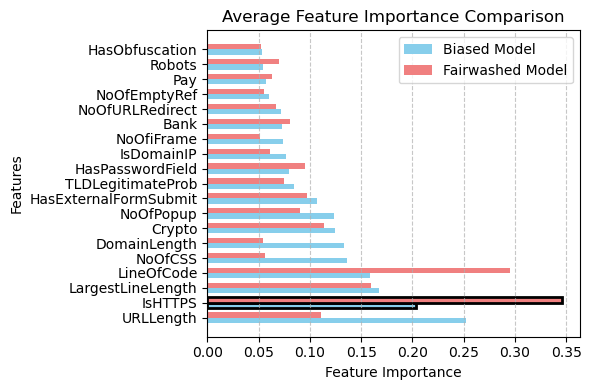


Top-10 Features Before and After Attack:
 Rank Before Attack (Biased Model) After Attack (Fairwashed Model)
    1                    URLLength                         IsHTTPS
    2                      IsHTTPS                      LineOfCode
    3            LargestLineLength               LargestLineLength
    4                   LineOfCode                          Crypto
    5                      NoOfCSS                       URLLength
    6                 DomainLength           HasExternalFormSubmit
    7                       Crypto                HasPasswordField
    8                    NoOfPopup                       NoOfPopup
    9        HasExternalFormSubmit                            Bank
   10            TLDLegitimateProb               TLDLegitimateProb
Average feature importance plots generated.


In [4]:
if __name__ == "__main__":
    # Note: The path to the dataset may need to be adjusted based on your file structure.
    data = pd.read_csv('../../../Dataset/PhiUSIIL_Phishing_URL_Dataset.csv')
    
    data = data.drop(data.select_dtypes(include='object').columns, axis=1)

    labels = data['label']
    features = data.drop(columns=['label'])
    
    sensitive_feature_name = 'IsHTTPS'
    
    # New: Define a list of features to promote
    target_explanation_feature_names = ['URLLength', 'NoOfEmptyRef']
    
    categorical_feature_names = ['IsDomainIP',
        'TLDLegitimateProb',
        'HasObfuscation',
        'IsHTTPS',
        'Robots',
        'HasExternalFormSubmit',
        'HasPasswordField',
        'Bank',
        'Pay',
        'Crypto']
    
    # --- New section to remove highly correlated features ---
    print("Checking for and removing highly correlated features...")
    correlation_matrix = features.corr(method='pearson').abs()
    upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
    
    # Find all columns with correlation greater than 0.35 and add them to a set
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.35)]
    
    # Ensure sensitive feature is not dropped
    if sensitive_feature_name in to_drop:
        to_drop.remove(sensitive_feature_name)
    
    if to_drop:
        print(f"Features removed due to high correlation (> 0.35): {to_drop}")
        features = features.drop(columns=to_drop)
    else:
        print("No features found to be highly correlated (Pearson's r > 0.35).")
    # --- End of new section ---
    
    original_feature_names = features.columns.tolist()

    # --- Robust Check for Feature Existence ---
    all_features_to_find = [sensitive_feature_name] + target_explanation_feature_names + categorical_feature_names
    missing_features = [f for f in all_features_to_find if f not in original_feature_names]

    if missing_features:
        print(f"Error: The following features are missing from the dataset: {missing_features}")
        print("Please check for typos or ensure these columns exist after your preprocessing steps.")
        print(f"Available features are: {original_feature_names}")
    else:
        # Get indices for all features if they exist
        sensitive_feat_idx = original_feature_names.index(sensitive_feature_name)
        target_expl_feat_indices = [original_feature_names.index(name) for name in target_explanation_feature_names]
        categorical_features_indices = [original_feature_names.index(col) for col in categorical_feature_names]

        # Split data into train and test sets
        X_train_unscaled, X_test_unscaled, y_train, y_test = train_test_split(
            features, labels, test_size=0.2, random_state=42
        )
    
        # Use a single StandardScaler on the full feature set
        scaler = sklearn.preprocessing.StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train_unscaled)
        X_test_scaled = scaler.transform(X_test_unscaled)
        
        final_feature_names = X_train_unscaled.columns.tolist()
        num_features_in_data = X_train_scaled.shape[1]

        print("\nTraining the biased base model...")
        biased_model_raw = base_model(
            x_train=X_train_scaled,
            y_train=y_train.values,
            num_epochs=50
        )
        print("Biased base model trained.")
        
        # Wrap the biased model with the scaler
        biased_model_wrapper = PyTorchModelWrapper(
            pytorch_model=biased_model_raw,
            scaler=scaler,
            input_feature_names=final_feature_names
        )

        # Evaluate the biased model on the unscaled test data
        biased_model_predictions = biased_model_wrapper.predict(X_test_unscaled)
        biased_model_accuracy = accuracy_score(y_test.values, biased_model_predictions)
        print("\n--- Biased Model Performance (Before Fairwashing) ---")
        print(f"Accuracy: {biased_model_accuracy:.4f}")
        print("Classification Report:")
        print(classification_report(y_test.values, biased_model_predictions))


        print("\nStarting Makrut Fairwashing Fine-tuning...")
        # New: Pass the list of target features to the MakrutFairwasher
        attacker = MakrutFairwasher(
            unfair_model_wrapper=biased_model_wrapper,
            scaler=scaler,
            train_data=X_train_scaled,
            feature_names=final_feature_names,
            sensitive_feature_index=sensitive_feat_idx,
            target_explanation_feature_indices=target_expl_feat_indices,
            num_classes=2,
            lambda1=10,
            lambda2=1,
            num_segments=200,
            device='cpu',
            categorical_features=categorical_features_indices
        )
        
        attacker.train()
        print("Fine-tuning complete.")
        
        print("\nEvaluating the Fairwashed Model's fidelity...")
        evaluation_results = attacker.evaluate_attack(
            test_data_features=X_test_unscaled,
            test_data_labels=y_test.values,
            sensitive_attribute_name=sensitive_feature_name
        )
        print("\nEvaluation Results:", evaluation_results)
        
        fairwashed_model_raw = attacker.get_fairwashed_model()
        print(f"\nFairwashed raw PyTorch model is ready: {type(fairwashed_model_raw).__name__}")

        fairwashed_model_wrapper = PyTorchModelWrapper(
            pytorch_model=fairwashed_model_raw,
            scaler=scaler,
            input_feature_names=final_feature_names
        )

        print("\nGenerating Average Feature Importance Comparison Plots...")
        
        num_explanation_samples = 2000
        
        all_unfair_explanations = []
        all_fairwashed_explanations = []

        if len(X_test_unscaled) < num_explanation_samples:
            print(f"Warning: Test data has only {len(X_test_unscaled)} samples. "
                  f"Generating explanations for all available samples instead of {num_explanation_samples}.")
            num_explanation_samples = len(X_test_unscaled)
        
        for i in tqdm(range(num_explanation_samples), desc="Generating Explanations"):
            instance_to_explain = X_test_unscaled.iloc[i].values
            instance_label = y_test.iloc[i]
            
            # Unfair model explanation
            unfair_expl_raw = attacker.explainer.explain_instance(
                instance_to_explain,
                predict_fn=biased_model_wrapper.predict_proba,
                num_features=num_features_in_data,
                labels=(instance_label,),
                num_samples=attacker.num_segments
            )
            if unfair_expl_raw:
                all_unfair_explanations.append(unfair_expl_raw.as_list(label=instance_label))

            # Fairwashed model explanation
            fairwashed_expl_raw = attacker.explainer.explain_instance(
                instance_to_explain,
                predict_fn=fairwashed_model_wrapper.predict_proba,
                num_features=num_features_in_data,
                labels=(instance_label,),
                num_samples=attacker.num_segments
            )
            if fairwashed_expl_raw:
                all_fairwashed_explanations.append(fairwashed_expl_raw.as_list(label=instance_label))

        plot_feature_importance(
            all_unfair_explanations,
            all_fairwashed_explanations,
            final_feature_names,
            sensitive_feature_name,
            # title=f"Average LIME Feature Importance (Over {num_explanation_samples} Samples)"
        )
        print("Average feature importance plots generated.")